# Quick Multi-Model Per-Dataset Single-Image Depth Check

Minimal notebook for running **one selected image per enabled dataset** through **all enabled depth models**, saving each prediction separately.

- No training
- No merged comparison grids
- One selected image per dataset, one output file per model

You can manually download and concatenate outputs later.


In [1]:
!git clone https://github.com/alooboii/EagleVision.git
%cd /kaggle/working/EagleVision

Cloning into 'EagleVision'...
remote: Enumerating objects: 300, done.
remote: Counting objects: 100% (300/300), done.
remote: Compressing objects: 100% (211/211), done.
remote: Total 300 (delta 115), reused 241 (delta 73), pack-reused 0 (from 0)
Receiving objects: 100% (300/300), 13.18 MiB | 14.87 MiB/s, done.
Resolving deltas: 100% (115/115), done.
/kaggle/working/EagleVision


In [2]:
# Optional if needed in Kaggle runtime:
# !pip -q install -U datasets transformers matplotlib pillow tqdm

import os
import sys
from pathlib import Path
from typing import Any

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

import torch
import torch.nn.functional as F
from datasets import load_dataset
from transformers import pipeline

# EagleVision imports (repo must be available)
from IPython.display import display


In [3]:
CONFIG = {
    # Kaggle paths
    "adapted_checkpoint_path": "/kaggle/input/models/rooonfr/best-adpated-100ep-scannet/pytorch/default/1/best_100ep.pt",
    "dav2_checkpoint_path": "baseline/depth_anything_v2/checkpoints/depth_anything_v2_metric_hypersim_vits.pth",

    # model settings (for EagleVision wrappers)
    "depth_mode": "metric",
    "encoder": "vits",
    "profile": "hypersim",
    "adapter_hidden_channels": 32,
    "normalize_backbone_input": False,

    # per-dataset single-image settings
    "random_sample_per_dataset": True,
    "random_seed": 42,
    "single_sample_index_per_dataset": 0,  # used only when random_sample_per_dataset=False
    "save_outputs": True,
    "save_raw_npy": True,
    "output_dir": "outputs/quick_depth_single_image_all_models",

    # evaluation settings
    "depth_eps": 1e-6,
    "min_valid_depth": 1e-3,

    # datasets to source one sample each from
    # ScanNet is enabled by default, RGB-only datasets disabled.
    "datasets": [
        {"name": "kaggle_scannet_2d", "type": "local_scannet_style", "root": "/kaggle/input/datasets/klein2111/scannet-2d/scannet_2d", "enabled": True},
        {"name": "nyu_depth_v2_hf", "type": "hf_nyu", "split": "validation", "enabled": False},
        {"name": "cifar100_val", "type": "hf_rgb", "hf_dataset": "cifar100", "split": "test", "image_key": "img", "enabled": False},
        {"name": "beans_val", "type": "hf_rgb", "hf_dataset": "beans", "split": "train", "image_key": "image", "enabled": False},
        {"name": "food101_val", "type": "hf_rgb", "hf_dataset": "food101", "split": "validation", "image_key": "image", "enabled": False},
    ],

    # model registry (enable/disable as needed)
    "models": [
        {"id": "ours_adapted", "kind": "eaglevision_adapted", "enabled": True},
        {"id": "ours_dav2_base", "kind": "eaglevision_base", "enabled": True},

        {"id": "depth_anything_v2_small", "kind": "hf_pipeline", "hf_model": "depth-anything/Depth-Anything-V2-Small-hf", "enabled": True},
        {"id": "depth_anything_v2_base", "kind": "hf_pipeline", "hf_model": "depth-anything/Depth-Anything-V2-Base-hf", "enabled": True},
        {"id": "depth_anything_v2_large", "kind": "hf_pipeline", "hf_model": "depth-anything/Depth-Anything-V2-Large-hf", "enabled": True},
        {"id": "depth_anything_v1_small", "kind": "hf_pipeline", "hf_model": "LiheYoung/depth-anything-small-hf", "enabled": True},
        {"id": "dpt_large", "kind": "hf_pipeline", "hf_model": "Intel/dpt-large", "enabled": True},
        {"id": "zoedepth_nyu_kitti", "kind": "hf_pipeline", "hf_model": "Intel/zoedepth-nyu-kitti", "enabled": True},

        # optional heavy model
        {"id": "midas_dpt_large", "kind": "torchhub_midas", "model_type": "DPT_Large", "enabled": False},
    ],
}

assert CONFIG["adapted_checkpoint_path"]
assert CONFIG["dav2_checkpoint_path"]


In [4]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device:", DEVICE)

KAGGLE_WORKING = Path("/kaggle/working")
RUNNING_ON_KAGGLE = KAGGLE_WORKING.exists()
REPO_DIR = (KAGGLE_WORKING / "EagleVision") if (RUNNING_ON_KAGGLE and (KAGGLE_WORKING / "EagleVision").exists()) else Path.cwd().resolve()

SRC_DIR = REPO_DIR / "src"
if str(SRC_DIR) not in sys.path:
    sys.path.insert(0, str(SRC_DIR))
if str(REPO_DIR) not in sys.path:
    sys.path.insert(0, str(REPO_DIR))

from eaglevision.models.depth.depth_anything_wrapper import DepthAnythingWithAdapter
from eaglevision.models.rt_depthnvs import RoundTripDepthNVS
from eaglevision.engine.checkpointing import load_checkpoint

OUT_DIR = REPO_DIR / CONFIG["output_dir"]
OUT_DIR.mkdir(parents=True, exist_ok=True)
print("repo:", REPO_DIR)
print("output:", OUT_DIR)

device: cuda
repo: /kaggle/working/EagleVision
output: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models


In [5]:
import subprocess, sys
from pathlib import Path

ckpt = REPO_DIR / "baseline/depth_anything_v2/checkpoints/depth_anything_v2_metric_hypersim_vits.pth"
ckpt.parent.mkdir(parents=True, exist_ok=True)

if not ckpt.exists():
    print("DAV2 checkpoint missing, downloading...")
    cmd = [
        sys.executable, "-m", "baseline.depth_anything_v2", "download",
        "--mode", "all",
        "--profile", CONFIG["profile"],
        "--encoder", CONFIG["encoder"],
    ]
    res = subprocess.run(cmd, cwd=REPO_DIR, text=True, capture_output=True)
    print(res.stdout[-1200:])
    if res.returncode != 0:
        print(res.stderr[-1200:])
        raise RuntimeError("DAV2 download failed. Enable internet or attach checkpoint as Kaggle input.")
else:
    print("DAV2 checkpoint already exists:", ckpt)

print("Exists now:", ckpt.exists(), ckpt)


DAV2 checkpoint missing, downloading...
relative:vits -> /kaggle/working/EagleVision/baseline/depth_anything_v2/checkpoints/depth_anything_v2_vits.pth (downloaded)
metric:hypersim:vits -> /kaggle/working/EagleVision/baseline/depth_anything_v2/checkpoints/depth_anything_v2_metric_hypersim_vits.pth (downloaded)

Exists now: True /kaggle/working/EagleVision/baseline/depth_anything_v2/checkpoints/depth_anything_v2_metric_hypersim_vits.pth


In [6]:
def resolve_ckpt(path_str: str, default_name: str | None = None) -> Path:
    p = Path(path_str)
    if not p.is_absolute():
        p = (REPO_DIR / p).resolve()
    if p.is_file():
        return p
    if p.is_dir():
        if default_name:
            c = p / default_name
            if c.is_file():
                return c
        cands = sorted(list(p.rglob("*.pth")) + list(p.rglob("*.pt")))
        if cands:
            return cands[0]
    raise FileNotFoundError(f"Checkpoint not found: {p}")


dav2_ckpt = resolve_ckpt(
    CONFIG["dav2_checkpoint_path"],
    default_name=f"depth_anything_v2_metric_{CONFIG['profile']}_{CONFIG['encoder']}.pth",
)
adapted_ckpt = resolve_ckpt(CONFIG["adapted_checkpoint_path"], default_name="best_100ep.pt")

print("dav2:", dav2_ckpt)
print("adapted:", adapted_ckpt)

dav2: /kaggle/working/EagleVision/baseline/depth_anything_v2/checkpoints/depth_anything_v2_metric_hypersim_vits.pth
adapted: /kaggle/input/models/rooonfr/best-adpated-100ep-scannet/pytorch/default/1/best_100ep.pt


In [7]:
def _to_tensor_rgb(image: Image.Image) -> torch.Tensor:
    arr = np.asarray(image.convert("RGB"), dtype=np.float32) / 255.0
    return torch.from_numpy(arr).permute(2, 0, 1)


class BaseEstimator:
    def predict(self, image: Image.Image):
        raise NotImplementedError


class EagleVisionAdaptedEstimator(BaseEstimator):
    def __init__(self):
        depth_model = DepthAnythingWithAdapter(
            mode=CONFIG["depth_mode"],
            encoder=CONFIG["encoder"],
            profile=CONFIG["profile"],
            checkpoint_path=dav2_ckpt,
            freeze_backbone=True,
            adapter_hidden_channels=CONFIG["adapter_hidden_channels"],
            normalize_backbone_input=CONFIG["normalize_backbone_input"],
        ).to(DEVICE).eval()
        self.model = RoundTripDepthNVS(depth_model).to(DEVICE).eval()
        load_checkpoint(adapted_ckpt, self.model)

    @torch.no_grad()
    def predict(self, image: Image.Image):
        x = _to_tensor_rgb(image).unsqueeze(0).to(DEVICE)
        out = self.model.depth_model(x)["adapted_depth"]
        return out


class EagleVisionBaseEstimator(BaseEstimator):
    def __init__(self):
        self.model = DepthAnythingWithAdapter(
            mode=CONFIG["depth_mode"],
            encoder=CONFIG["encoder"],
            profile=CONFIG["profile"],
            checkpoint_path=dav2_ckpt,
            freeze_backbone=True,
            adapter_hidden_channels=CONFIG["adapter_hidden_channels"],
            normalize_backbone_input=CONFIG["normalize_backbone_input"],
        ).to(DEVICE).eval()

    @torch.no_grad()
    def predict(self, image: Image.Image):
        x = _to_tensor_rgb(image).unsqueeze(0).to(DEVICE)
        out = self.model(x)["base_depth"]
        return out


class HFPipelineEstimator(BaseEstimator):
    def __init__(self, model_id: str):
        self.pipe = pipeline("depth-estimation", model=model_id, device=0 if DEVICE.type == "cuda" else -1)

    def predict(self, image: Image.Image):
        out = self.pipe(image)
        if "predicted_depth" in out:
            return out["predicted_depth"]
        return out["depth"]


class MiDaSEstimator(BaseEstimator):
    def __init__(self, model_type: str = "DPT_Large"):
        self.model = torch.hub.load("intel-isl/MiDaS", model_type).to(DEVICE).eval()
        transforms = torch.hub.load("intel-isl/MiDaS", "transforms")
        self.transform = transforms.dpt_transform if "DPT" in model_type else transforms.small_transform

    @torch.no_grad()
    def predict(self, image: Image.Image):
        arr = np.asarray(image.convert("RGB"))
        inp = self.transform(arr).to(DEVICE)
        pred = self.model(inp)
        pred = F.interpolate(pred.unsqueeze(1), size=arr.shape[:2], mode="bicubic", align_corners=False).squeeze()
        return pred


def try_build_estimator(spec: dict[str, Any]):
    try:
        kind = spec["kind"]
        if kind == "eaglevision_adapted":
            return EagleVisionAdaptedEstimator(), None
        if kind == "eaglevision_base":
            return EagleVisionBaseEstimator(), None
        if kind == "hf_pipeline":
            return HFPipelineEstimator(spec["hf_model"]), None
        if kind == "torchhub_midas":
            return MiDaSEstimator(spec.get("model_type", "DPT_Large")), None
        return None, f"Unknown model kind: {kind}"
    except Exception as e:
        return None, repr(e)

In [8]:
def to_depth_2d(pred, target_hw=None) -> np.ndarray:
    if torch.is_tensor(pred):
        pred = pred.detach().cpu().numpy()
    if isinstance(pred, Image.Image):
        pred = np.asarray(pred)

    pred = np.asarray(pred)

    while pred.ndim > 2 and pred.shape[0] == 1:
        pred = pred[0]

    if pred.ndim == 3:
        if pred.shape[-1] in (1, 3, 4):
            pred = pred[..., 0]
        else:
            pred = pred[0]

    if pred.ndim == 1:
        if target_hw is None:
            raise ValueError(f"1D depth output {pred.shape} without target_hw")
        h, w = target_hw
        n = pred.shape[0]
        if n == w:
            pred = np.tile(pred[None, :], (h, 1))
        elif n == h:
            pred = np.tile(pred[:, None], (1, w))
        elif n == h * w:
            pred = pred.reshape(h, w)
        else:
            raise ValueError(f"Cannot reshape 1D depth of length {n} to {(h, w)}")

    if pred.ndim != 2:
        raise ValueError(f"Expected 2D depth map, got shape {pred.shape}")

    return pred.astype(np.float32)


def resize_depth_like_np(pred_2d: np.ndarray, h: int, w: int) -> np.ndarray:
    t = torch.from_numpy(pred_2d).unsqueeze(0).unsqueeze(0).float()
    out = F.interpolate(t, size=(h, w), mode="bilinear", align_corners=False)
    return out[0, 0].cpu().numpy().astype(np.float32)


def robust_range(depth: np.ndarray):
    m = np.isfinite(depth)
    if m.sum() == 0:
        return 0.0, 1.0
    lo, hi = np.percentile(depth[m], [2, 98])
    if hi <= lo:
        hi = lo + 1e-6
    return float(lo), float(hi)

def model_near_is_larger(spec: dict) -> bool:
    """Heuristic: True when model output is inverse/relative depth (larger value = nearer)."""
    if "near_is_larger" in spec:
        return bool(spec["near_is_larger"])

    kind = str(spec.get("kind", "")).lower()
    mid = str(spec.get("id", "")).lower()
    hf = str(spec.get("hf_model", "")).lower()
    model_type = str(spec.get("model_type", "")).lower()
    text = " ".join([kind, mid, hf, model_type])

    # Our EagleVision + ZoeDepth produce metric depth (larger = farther)
    if "eaglevision_adapted" in kind or "eaglevision_base" in kind:
        return False
    if "zoedepth" in text:
        return False

    # Depth-Anything / DPT / MiDaS HF outputs are relative/inverse-like (larger = nearer)
    if ("depth-anything" in text) or ("depth_anything" in text) or ("dpt" in text) or ("midas" in text):
        return True

    # Conservative default for generic HF monocular depth heads
    if kind == "hf_pipeline":
        return True

    return False


def depth_to_bright_near_rgb(
    depth: np.ndarray,
    vmin: float | None = None,
    vmax: float | None = None,
    cmap_name: str = "magma",
    near_is_larger: bool = False,
) -> np.ndarray:
    """Colorize depth so that brighter colors always mean nearer depth."""
    d = np.asarray(depth, dtype=np.float32)
    if vmin is None or vmax is None:
        vmin, vmax = robust_range(d)

    denom = max(vmax - vmin, 1e-6)
    norm = np.clip((d - vmin) / denom, 0.0, 1.0)

    # If larger values already mean nearer, keep norm as-is. Otherwise invert.
    norm_near = norm if near_is_larger else (1.0 - norm)

    color = (plt.get_cmap(cmap_name)(norm_near)[..., :3] * 255).astype(np.uint8)
    return color

def align_prediction_for_eval(pred: np.ndarray, gt: np.ndarray | None, near_is_larger: bool, eps: float = 1e-6) -> tuple[np.ndarray, float]:
    """Convert model output to depth-like scale and optionally median-align to GT."""
    p = np.asarray(pred, dtype=np.float32)

    # Relative/inverse outputs (Depth-Anything/DPT/MiDaS families) -> invert first.
    if near_is_larger:
        p = 1.0 / np.maximum(p, eps)

    scale = 1.0
    if gt is not None:
        g = np.asarray(gt, dtype=np.float32)
        valid = np.isfinite(g) & np.isfinite(p) & (g > CONFIG.get("min_valid_depth", 1e-3)) & (p > eps)
        if int(valid.sum()) > 32:
            med_p = float(np.median(p[valid]))
            med_g = float(np.median(g[valid]))
            if med_p > eps and np.isfinite(med_p) and np.isfinite(med_g):
                scale = med_g / med_p
                p = p * scale

    return p.astype(np.float32), float(scale)


def compute_depth_metrics(pred: np.ndarray, gt: np.ndarray, eps: float = 1e-6) -> dict[str, float]:
    p = np.asarray(pred, dtype=np.float32)
    g = np.asarray(gt, dtype=np.float32)
    valid = np.isfinite(g) & np.isfinite(p) & (g > CONFIG.get("min_valid_depth", 1e-3)) & (p > eps)

    n_valid = int(valid.sum())
    if n_valid < 32:
        return {"valid_px": n_valid, "abs_rel": np.nan, "rmse": np.nan, "l1": np.nan, "delta1": np.nan}

    pv = p[valid]
    gv = g[valid]

    abs_rel = float(np.mean(np.abs(gv - pv) / np.maximum(gv, eps)))
    rmse = float(np.sqrt(np.mean((gv - pv) ** 2)))
    l1 = float(np.mean(np.abs(gv - pv)))
    ratio = np.maximum(gv / np.maximum(pv, eps), pv / np.maximum(gv, eps))
    delta1 = float(np.mean(ratio < 1.25))

    return {"valid_px": n_valid, "abs_rel": abs_rel, "rmse": rmse, "l1": l1, "delta1": delta1}



In [9]:
def _to_depth_np(depth_any: Any) -> np.ndarray:
    if torch.is_tensor(depth_any):
        d = depth_any.detach().cpu().numpy()
    elif isinstance(depth_any, Image.Image):
        d = np.asarray(depth_any)
    else:
        d = np.asarray(depth_any)

    d = d.astype(np.float32)
    while d.ndim > 2 and d.shape[0] == 1:
        d = d[0]
    if d.ndim == 3:
        if d.shape[-1] in (1, 3, 4):
            d = d[..., 0]
        else:
            d = d[0]
    return d.astype(np.float32)


def _normalize_depth_units(depth: np.ndarray) -> np.ndarray:
    d = np.asarray(depth, dtype=np.float32)
    if d.size == 0:
        return d
    mx = float(np.nanmax(d)) if np.isfinite(d).any() else 0.0
    # ScanNet style depth PNGs are usually in millimeters.
    if mx > 1000.0:
        d = d / 1000.0
    return d.astype(np.float32)


def load_hf_nyu_images(split: str, n: int):
    ds = None
    errors = []
    for cand in [
        {"path": "sayakpaul/nyu_depth_v2", "kwargs": {"revision": "refs/convert/parquet"}},
        {"path": "sayakpaul/nyu_depth_v2", "kwargs": {}},
    ]:
        try:
            ds = load_dataset(cand["path"], split=split, **cand["kwargs"])
            break
        except Exception as e:
            errors.append(str(e))
    if ds is None:
        raise RuntimeError("NYU load failed: " + " | ".join(errors))

    out = []
    for i in range(min(n, len(ds))):
        ex = ds[i]
        gt_depth = None
        if "depth" in ex:
            try:
                gt_depth = _normalize_depth_units(_to_depth_np(ex["depth"]))
            except Exception:
                gt_depth = None

        out.append({
            "dataset": "nyu_depth_v2_hf",
            "sample_id": f"nyu_{i:06d}",
            "image": ex["image"].convert("RGB"),
            "gt_depth": gt_depth,
        })
    return out


def load_hf_rgb_images(dataset_name: str, split: str, image_key: str, n: int, label: str):
    ds = load_dataset(dataset_name, split=split)
    out = []
    for i in range(min(n, len(ds))):
        im = ds[i][image_key]
        if not isinstance(im, Image.Image):
            im = Image.fromarray(np.asarray(im))
        out.append({"dataset": label, "sample_id": f"{label}_{i:06d}", "image": im.convert("RGB"), "gt_depth": None})
    return out


def _read_depth_file(path: Path) -> np.ndarray | None:
    if not path.exists():
        return None
    if path.suffix.lower() == ".npy":
        d = np.load(path)
    else:
        d = cv2.imread(str(path), cv2.IMREAD_UNCHANGED)
    if d is None:
        return None
    return _normalize_depth_units(_to_depth_np(d))


def load_local_scannet_images(root: str, n: int):
    rootp = Path(root)
    rows = []
    if not rootp.exists():
        return rows

    scenes = sorted([p for p in rootp.glob("*") if p.is_dir()])
    for scene in scenes:
        cdir = next((d for d in [scene / "color", scene / "rgb", scene / "images"] if d.exists()), None)
        ddir = next((d for d in [scene / "depth", scene / "depths"] if d.exists()), None)
        if cdir is None:
            continue

        color_paths = sorted(cdir.glob("*.jpg")) + sorted(cdir.glob("*.jpeg")) + sorted(cdir.glob("*.png"))
        for cp in color_paths:
            gt_depth = None
            if ddir is not None:
                d_png = ddir / f"{cp.stem}.png"
                d_npy = ddir / f"{cp.stem}.npy"
                gt_depth = _read_depth_file(d_png)
                if gt_depth is None:
                    gt_depth = _read_depth_file(d_npy)

            rows.append({
                "dataset": "kaggle_scannet_2d",
                "sample_id": f"{scene.name}_{cp.stem}",
                "image": Image.open(cp).convert("RGB"),
                "gt_depth": gt_depth,
            })

            if len(rows) >= n:
                return rows
    return rows


In [10]:
# Select one sample from each enabled dataset
use_random = bool(CONFIG.get("random_sample_per_dataset", True))
fixed_idx = int(CONFIG.get("single_sample_index_per_dataset", 0))
seed = CONFIG.get("random_seed", None)
rng = np.random.default_rng(seed) if seed is not None else np.random.default_rng()

# Load a reasonable pool per dataset; random pick is drawn from this pool
min_pool = max(8, fixed_idx + 1)

selected_samples = []

for d in CONFIG["datasets"]:
    if not d.get("enabled", False):
        continue

    try:
        if d["type"] == "hf_nyu":
            samples = load_hf_nyu_images(d.get("split", "validation"), min_pool)
        elif d["type"] == "hf_rgb":
            samples = load_hf_rgb_images(
                d["hf_dataset"],
                d.get("split", "train"),
                d.get("image_key", "image"),
                min_pool,
                d["name"],
            )
        elif d["type"] == "local_scannet_style":
            samples = load_local_scannet_images(d["root"], min_pool)
        else:
            samples = []

        print(f"{d['name']}: loaded {len(samples)} samples")
        if len(samples) == 0:
            print("  [skip] no samples available")
            continue

        if use_random:
            idx = int(rng.integers(0, len(samples)))
        else:
            if fixed_idx < 0 or fixed_idx >= len(samples):
                print(f"  [skip] index {fixed_idx} out of range (have {len(samples)})")
                continue
            idx = fixed_idx

        chosen = samples[idx]
        selected_samples.append(chosen)
        has_gt = chosen.get("gt_depth") is not None
        print(f"  selected idx={idx} -> {chosen['dataset']} | {chosen['sample_id']} | has_gt={has_gt}")

        if CONFIG["save_outputs"]:
            rgb_path = OUT_DIR / f"{chosen['dataset']}__{chosen['sample_id']}__rgb.png"
            chosen["image"].save(rgb_path)
            print("  saved RGB:", rgb_path)

            gt = chosen.get("gt_depth")
            if gt is not None:
                gmin, gmax = robust_range(gt)
                gt_rgb = depth_to_bright_near_rgb(gt, vmin=gmin, vmax=gmax, cmap_name="magma", near_is_larger=False)
                gt_png = OUT_DIR / f"{chosen['dataset']}__{chosen['sample_id']}__gt_depth.png"
                Image.fromarray(gt_rgb).save(gt_png)
                print("  saved GT depth:", gt_png)

                if CONFIG.get("save_raw_npy", True):
                    gt_npy = OUT_DIR / f"{chosen['dataset']}__{chosen['sample_id']}__gt_depth.npy"
                    np.save(gt_npy, np.asarray(gt, dtype=np.float32))
                    print("  saved GT raw:", gt_npy)

    except Exception as e:
        print(f"[skip dataset] {d['name']}: {e}")

if len(selected_samples) == 0:
    raise RuntimeError("No per-dataset samples selected. Check dataset settings and index.")

print("\nTotal selected samples:", len(selected_samples))


default/partial-train/0000.parquet:   0%|          | 0.00/217M [00:00<?, ?B/s]

default/partial-train/0001.parquet:   0%|          | 0.00/258M [00:00<?, ?B/s]

default/partial-train/0002.parquet:   0%|          | 0.00/249M [00:00<?, ?B/s]

default/partial-train/0003.parquet:   0%|          | 0.00/252M [00:00<?, ?B/s]

default/partial-train/0004.parquet:   0%|          | 0.00/234M [00:00<?, ?B/s]

default/partial-train/0005.parquet:   0%|          | 0.00/245M [00:00<?, ?B/s]

default/partial-train/0006.parquet:   0%|          | 0.00/244M [00:00<?, ?B/s]

default/partial-train/0007.parquet:   0%|          | 0.00/246M [00:00<?, ?B/s]

default/partial-validation/0000.parquet:   0%|          | 0.00/634M [00:00<?, ?B/s]

default/partial-validation/0001.parquet:   0%|          | 0.00/406M [00:00<?, ?B/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating validation split: 0 examples [00:00, ? examples/s]

nyu_depth_v2_hf: loaded 8 samples
  selected idx=0 -> nyu_depth_v2_hf | nyu_000000
  saved RGB: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/nyu_depth_v2_hf__nyu_000000__rgb.png


README.md: 0.00B [00:00, ?B/s]

cifar100/train-00000-of-00001.parquet:   0%|          | 0.00/119M [00:00<?, ?B/s]

cifar100/test-00000-of-00001.parquet:   0%|          | 0.00/23.8M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/50000 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/10000 [00:00<?, ? examples/s]

cifar100_val: loaded 8 samples
  selected idx=6 -> cifar100_val | cifar100_val_000006
  saved RGB: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/cifar100_val__cifar100_val_000006__rgb.png


README.md: 0.00B [00:00, ?B/s]

data/train-00000-of-00001.parquet:   0%|          | 0.00/144M [00:00<?, ?B/s]

data/validation-00000-of-00001.parquet:   0%|          | 0.00/18.5M [00:00<?, ?B/s]

data/test-00000-of-00001.parquet:   0%|          | 0.00/17.7M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/1034 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/133 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/128 [00:00<?, ? examples/s]

beans_val: loaded 8 samples
  selected idx=5 -> beans_val | beans_val_000005
  saved RGB: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/beans_val__beans_val_000005__rgb.png


README.md: 0.00B [00:00, ?B/s]

data/train-00000-of-00008.parquet:   0%|          | 0.00/490M [00:00<?, ?B/s]

data/train-00001-of-00008.parquet:   0%|          | 0.00/464M [00:00<?, ?B/s]

data/train-00002-of-00008.parquet:   0%|          | 0.00/472M [00:00<?, ?B/s]

data/train-00003-of-00008.parquet:   0%|          | 0.00/464M [00:00<?, ?B/s]

data/train-00004-of-00008.parquet:   0%|          | 0.00/475M [00:00<?, ?B/s]

data/train-00005-of-00008.parquet:   0%|          | 0.00/470M [00:00<?, ?B/s]

data/train-00006-of-00008.parquet:   0%|          | 0.00/478M [00:00<?, ?B/s]

data/train-00007-of-00008.parquet:   0%|          | 0.00/486M [00:00<?, ?B/s]

data/validation-00000-of-00003.parquet:   0%|          | 0.00/423M [00:00<?, ?B/s]

data/validation-00001-of-00003.parquet:   0%|          | 0.00/413M [00:00<?, ?B/s]

data/validation-00002-of-00003.parquet:   0%|          | 0.00/426M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/75750 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/25250 [00:00<?, ? examples/s]

food101_val: loaded 8 samples
  selected idx=3 -> food101_val | food101_val_000003
  saved RGB: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/food101_val__food101_val_000003__rgb.png

Total selected samples: 4


Enabled models:
 - ours_adapted
 - ours_dav2_base
 - depth_anything_v2_small
 - depth_anything_v2_base
 - depth_anything_v2_large
 - depth_anything_v1_small
 - dpt_large
 - zoedepth_nyu_kitti
Loading model: ours_adapted
  [ok]
Loading model: ours_dav2_base
  [ok]
Loading model: depth_anything_v2_small


config.json:   0%|          | 0.00/950 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/99.2M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/287 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/775 [00:00<?, ?B/s]

The image processor of type `DPTImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


  [ok]
Loading model: depth_anything_v2_base


config.json:   0%|          | 0.00/953 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/390M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/287 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/775 [00:00<?, ?B/s]

  [ok]
Loading model: depth_anything_v2_large


config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/1.34G [00:00<?, ?B/s]

Loading weights:   0%|          | 0/503 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/775 [00:00<?, ?B/s]

  [ok]
Loading model: depth_anything_v1_small


config.json:   0%|          | 0.00/954 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/99.2M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/287 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/437 [00:00<?, ?B/s]

  [ok]
Loading model: dpt_large


config.json:   0%|          | 0.00/942 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.37G [00:00<?, ?B/s]

Loading weights:   0%|          | 0/458 [00:00<?, ?it/s]

DPTForDepthEstimation LOAD REPORT from: Intel/dpt-large
Key                                                            | Status  | 
---------------------------------------------------------------+---------+-
neck.fusion_stage.layers.0.residual_layer1.convolution2.bias   | MISSING | 
neck.fusion_stage.layers.0.residual_layer1.convolution2.weight | MISSING | 
neck.fusion_stage.layers.0.residual_layer1.convolution1.bias   | MISSING | 
neck.fusion_stage.layers.0.residual_layer1.convolution1.weight | MISSING | 

Notes:
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


preprocessor_config.json:   0%|          | 0.00/285 [00:00<?, ?B/s]

  [ok]
Loading model: zoedepth_nyu_kitti


config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/1.38G [00:00<?, ?B/s]

Loading weights:   0%|          | 0/647 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/723 [00:00<?, ?B/s]

The image processor of type `ZoeDepthImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


  [ok]

=== Sample: nyu_depth_v2_hf | nyu_000000 ===


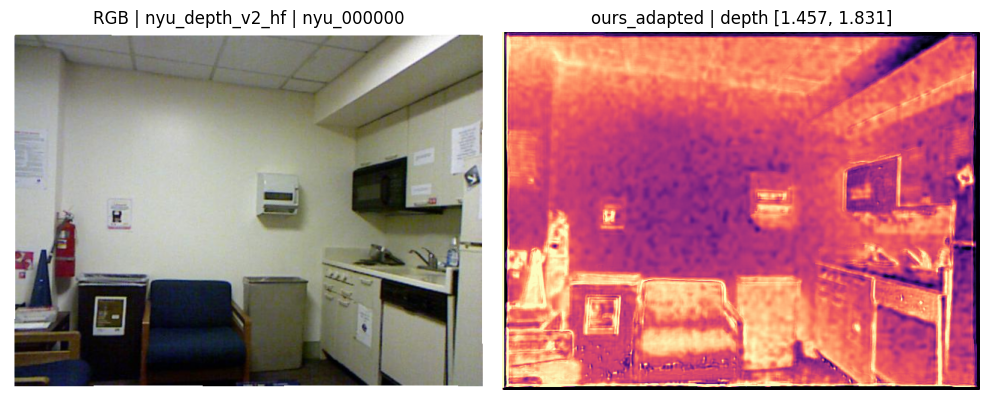

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/nyu_depth_v2_hf__nyu_000000__ours_adapted__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/nyu_depth_v2_hf__nyu_000000__ours_adapted__depth.npy


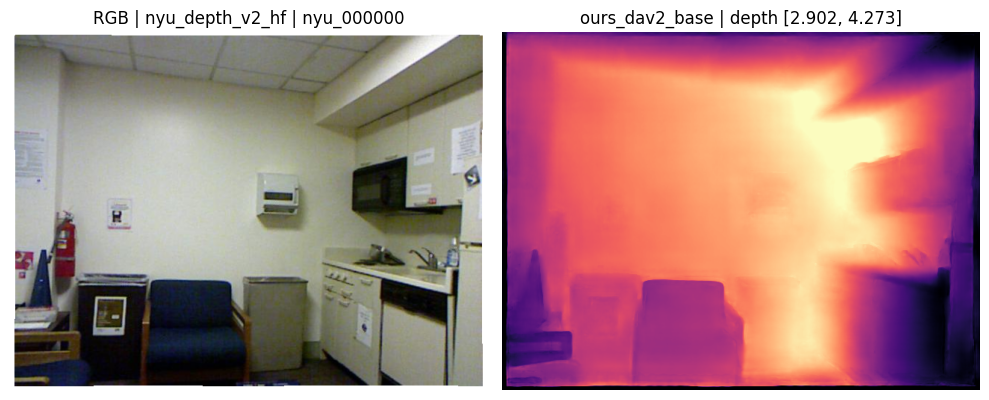

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/nyu_depth_v2_hf__nyu_000000__ours_dav2_base__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/nyu_depth_v2_hf__nyu_000000__ours_dav2_base__depth.npy


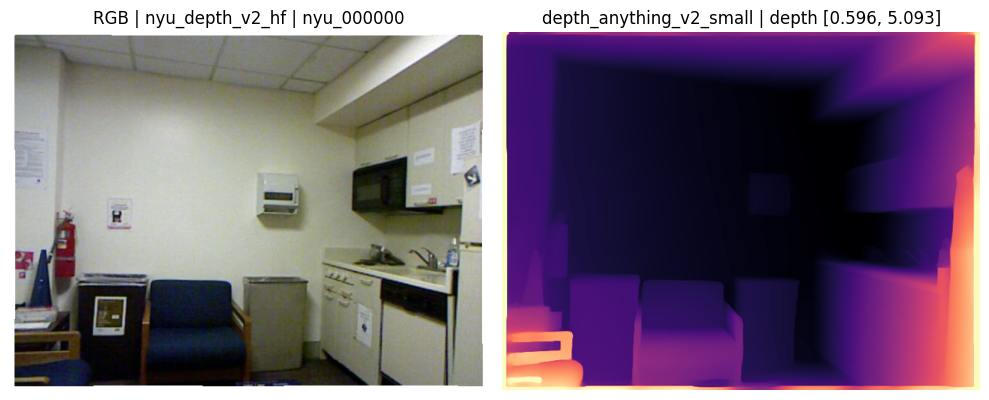

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/nyu_depth_v2_hf__nyu_000000__depth_anything_v2_small__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/nyu_depth_v2_hf__nyu_000000__depth_anything_v2_small__depth.npy


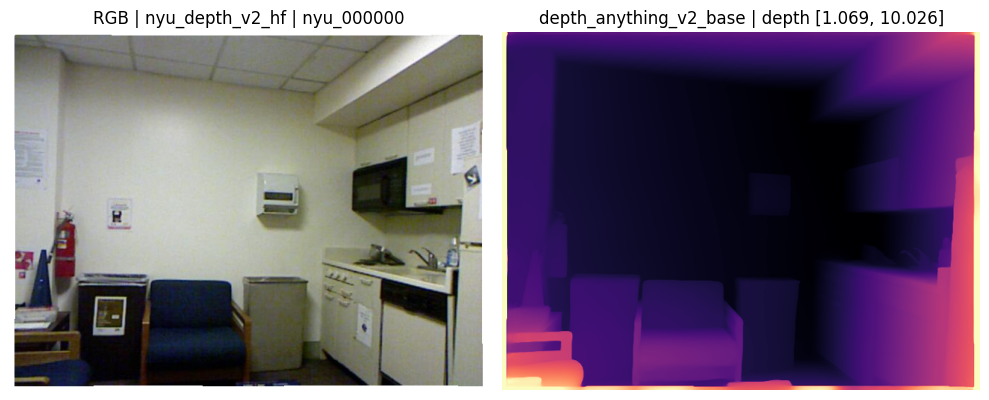

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/nyu_depth_v2_hf__nyu_000000__depth_anything_v2_base__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/nyu_depth_v2_hf__nyu_000000__depth_anything_v2_base__depth.npy


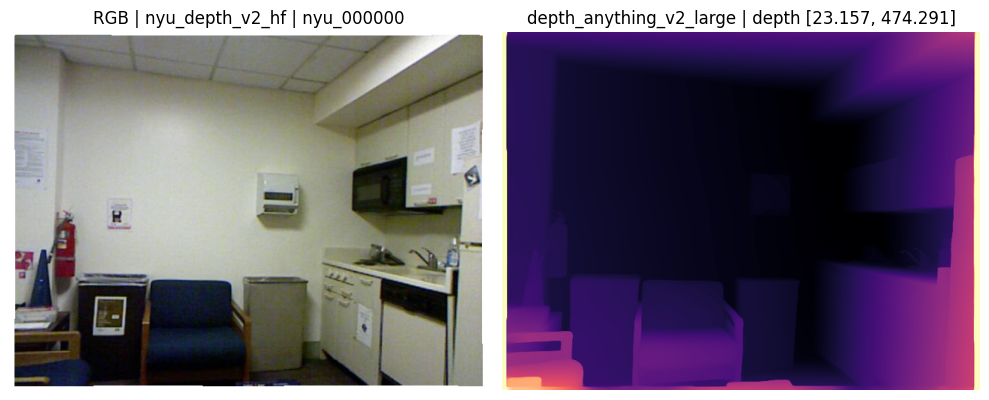

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/nyu_depth_v2_hf__nyu_000000__depth_anything_v2_large__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/nyu_depth_v2_hf__nyu_000000__depth_anything_v2_large__depth.npy


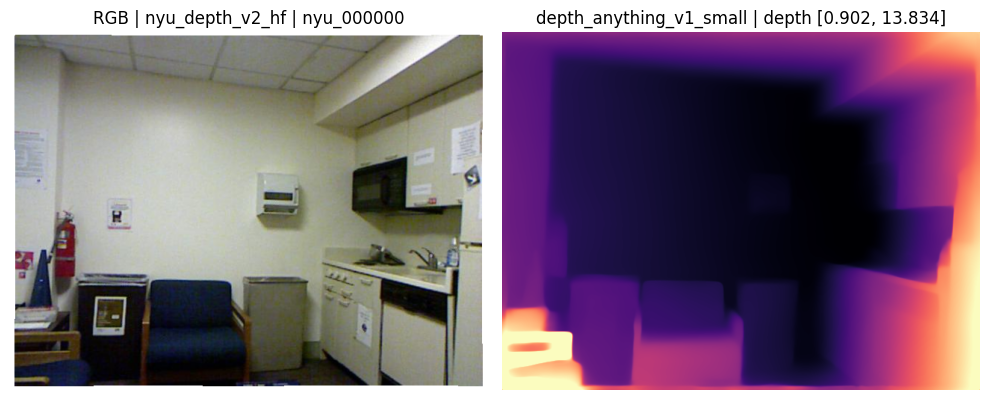

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/nyu_depth_v2_hf__nyu_000000__depth_anything_v1_small__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/nyu_depth_v2_hf__nyu_000000__depth_anything_v1_small__depth.npy


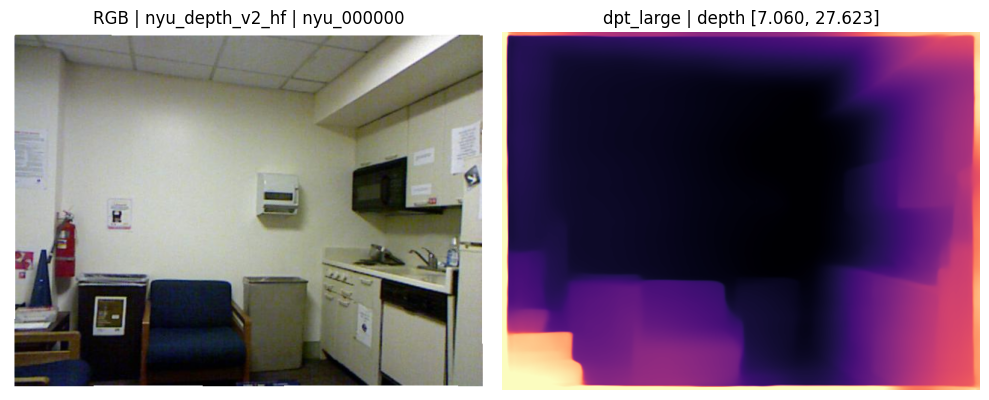

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/nyu_depth_v2_hf__nyu_000000__dpt_large__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/nyu_depth_v2_hf__nyu_000000__dpt_large__depth.npy


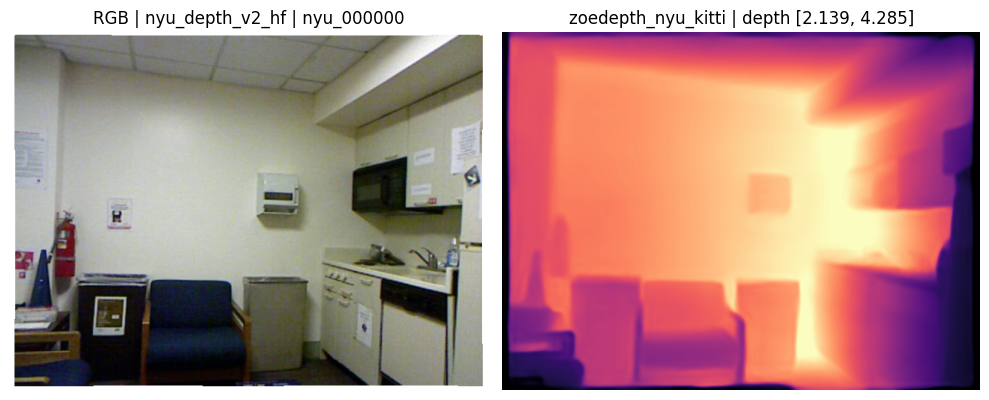

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/nyu_depth_v2_hf__nyu_000000__zoedepth_nyu_kitti__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/nyu_depth_v2_hf__nyu_000000__zoedepth_nyu_kitti__depth.npy

=== Sample: cifar100_val | cifar100_val_000006 ===


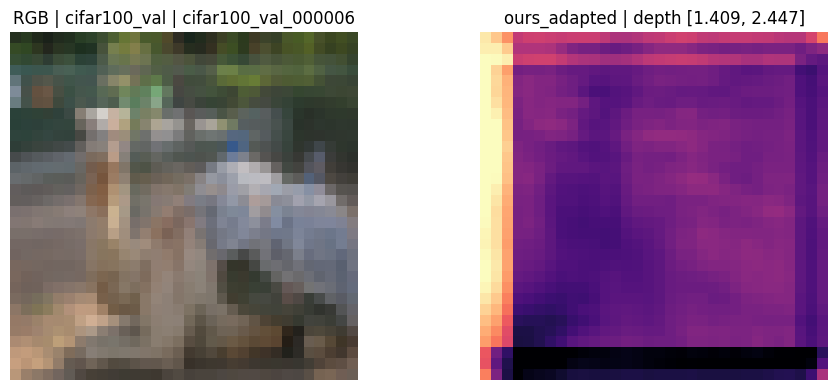

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/cifar100_val__cifar100_val_000006__ours_adapted__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/cifar100_val__cifar100_val_000006__ours_adapted__depth.npy


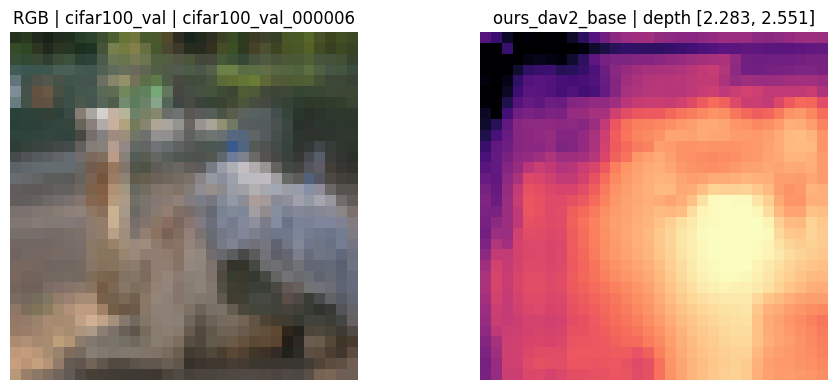

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/cifar100_val__cifar100_val_000006__ours_dav2_base__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/cifar100_val__cifar100_val_000006__ours_dav2_base__depth.npy


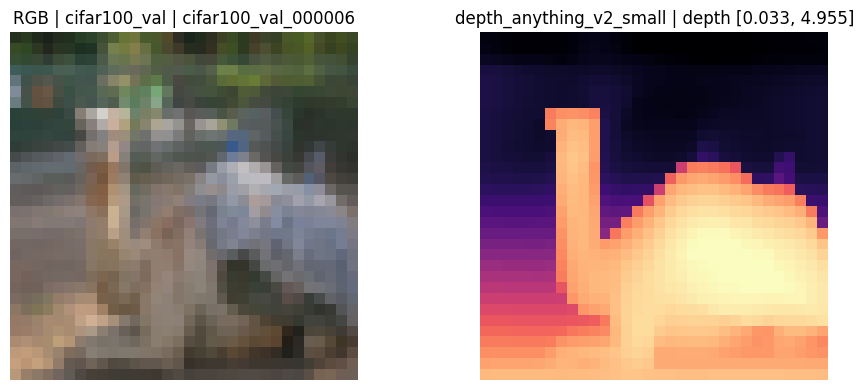

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/cifar100_val__cifar100_val_000006__depth_anything_v2_small__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/cifar100_val__cifar100_val_000006__depth_anything_v2_small__depth.npy


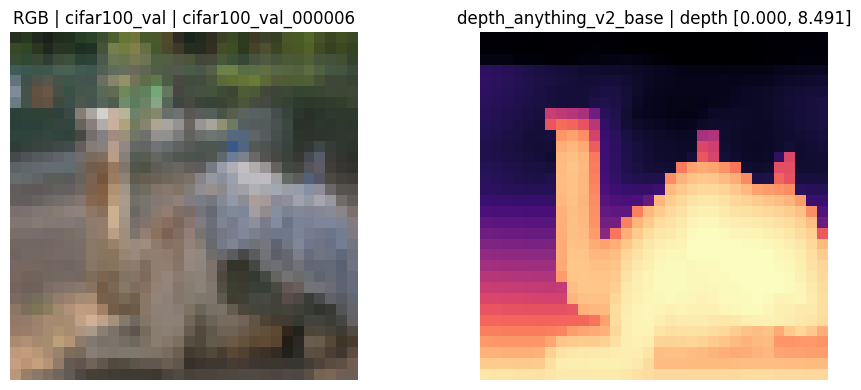

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/cifar100_val__cifar100_val_000006__depth_anything_v2_base__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/cifar100_val__cifar100_val_000006__depth_anything_v2_base__depth.npy


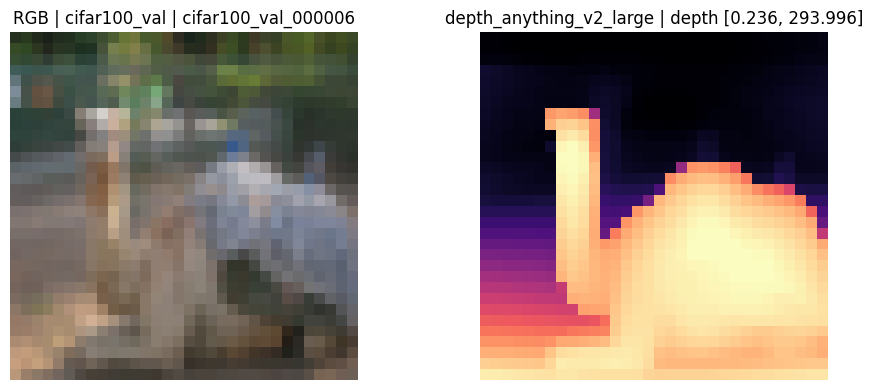

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/cifar100_val__cifar100_val_000006__depth_anything_v2_large__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/cifar100_val__cifar100_val_000006__depth_anything_v2_large__depth.npy


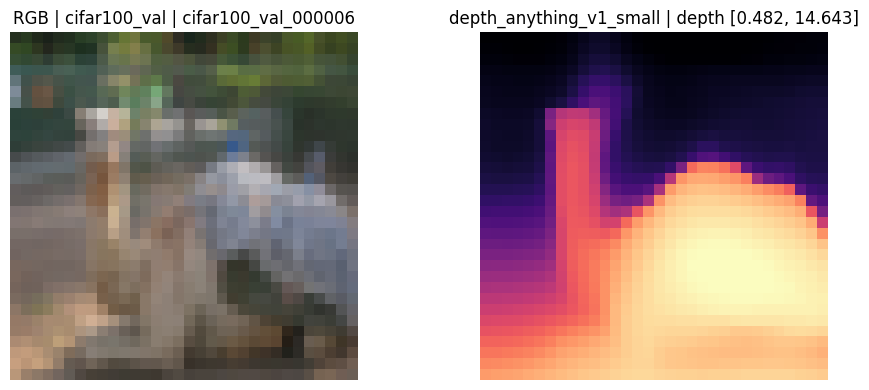

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/cifar100_val__cifar100_val_000006__depth_anything_v1_small__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/cifar100_val__cifar100_val_000006__depth_anything_v1_small__depth.npy


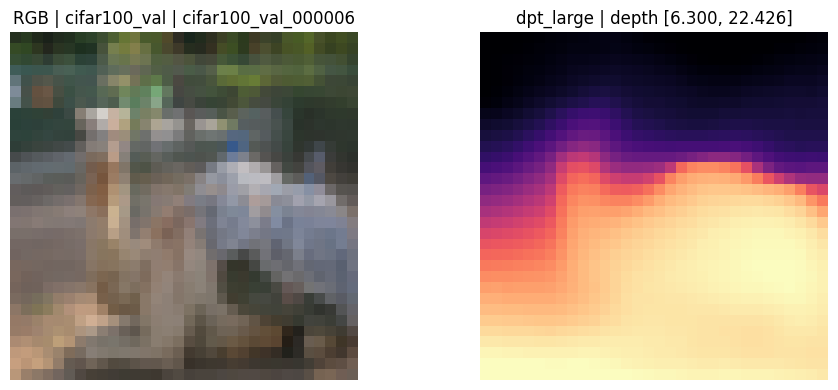

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/cifar100_val__cifar100_val_000006__dpt_large__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/cifar100_val__cifar100_val_000006__dpt_large__depth.npy


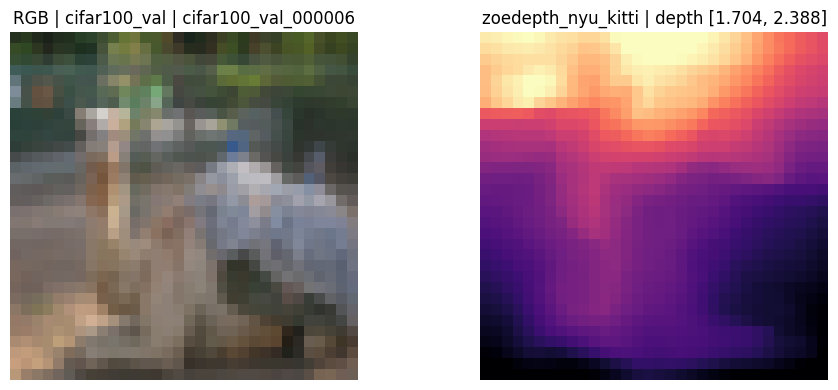

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/cifar100_val__cifar100_val_000006__zoedepth_nyu_kitti__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/cifar100_val__cifar100_val_000006__zoedepth_nyu_kitti__depth.npy

=== Sample: beans_val | beans_val_000005 ===


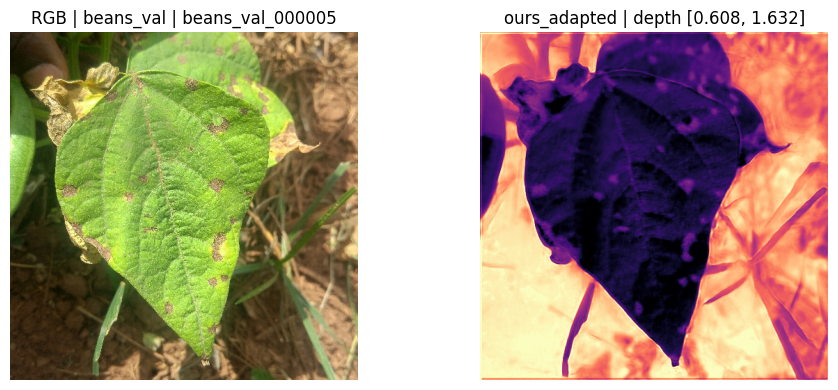

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/beans_val__beans_val_000005__ours_adapted__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/beans_val__beans_val_000005__ours_adapted__depth.npy


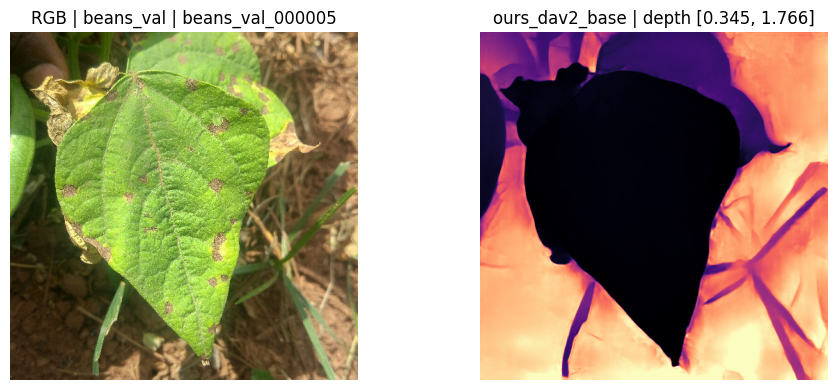

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/beans_val__beans_val_000005__ours_dav2_base__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/beans_val__beans_val_000005__ours_dav2_base__depth.npy


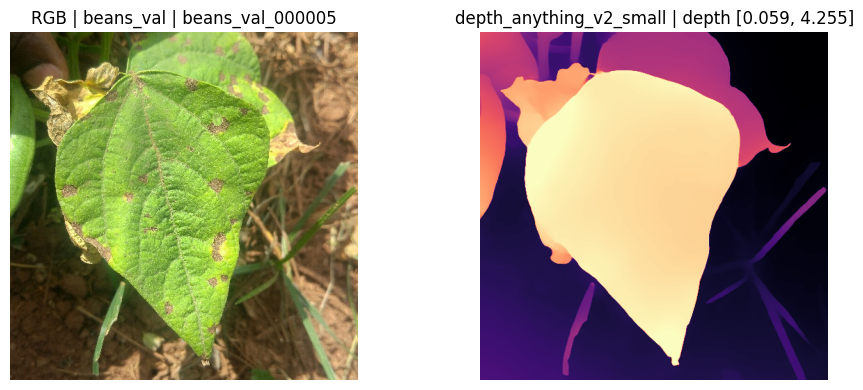

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/beans_val__beans_val_000005__depth_anything_v2_small__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/beans_val__beans_val_000005__depth_anything_v2_small__depth.npy


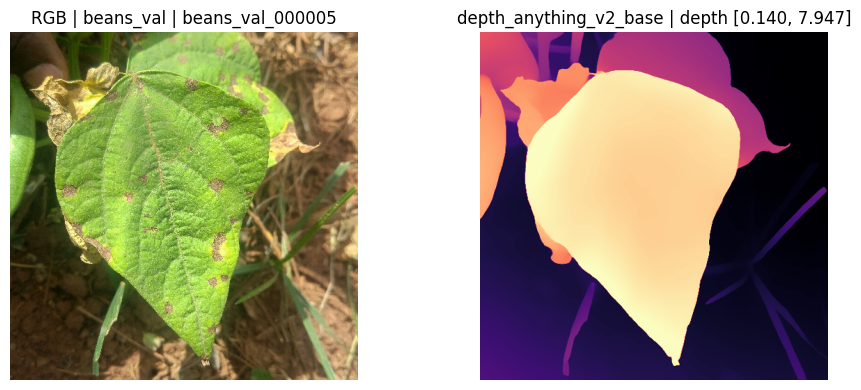

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/beans_val__beans_val_000005__depth_anything_v2_base__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/beans_val__beans_val_000005__depth_anything_v2_base__depth.npy


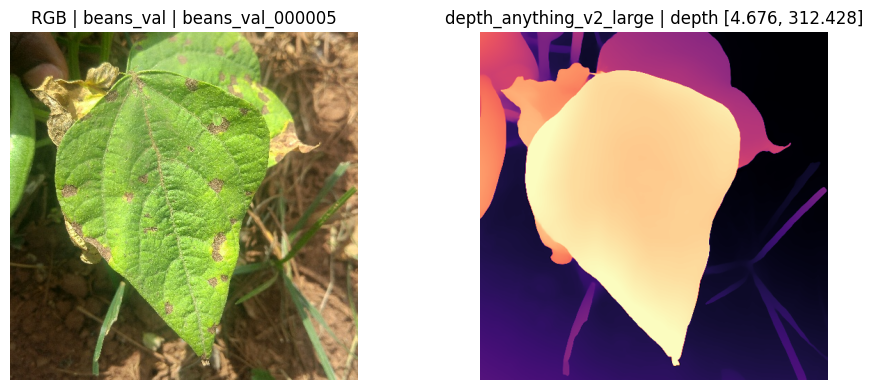

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/beans_val__beans_val_000005__depth_anything_v2_large__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/beans_val__beans_val_000005__depth_anything_v2_large__depth.npy


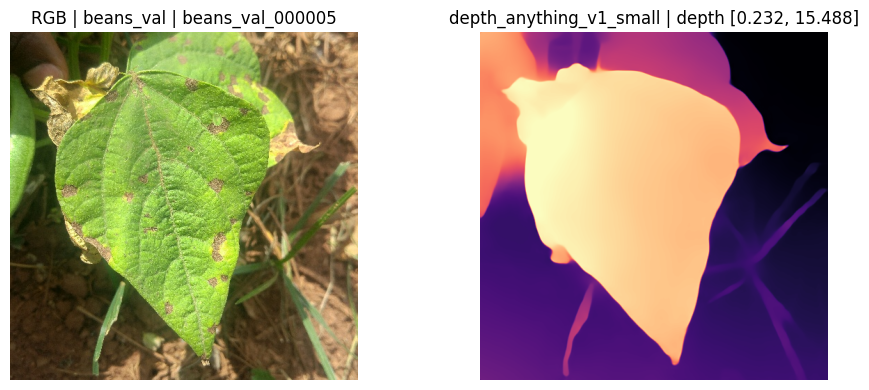

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/beans_val__beans_val_000005__depth_anything_v1_small__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/beans_val__beans_val_000005__depth_anything_v1_small__depth.npy


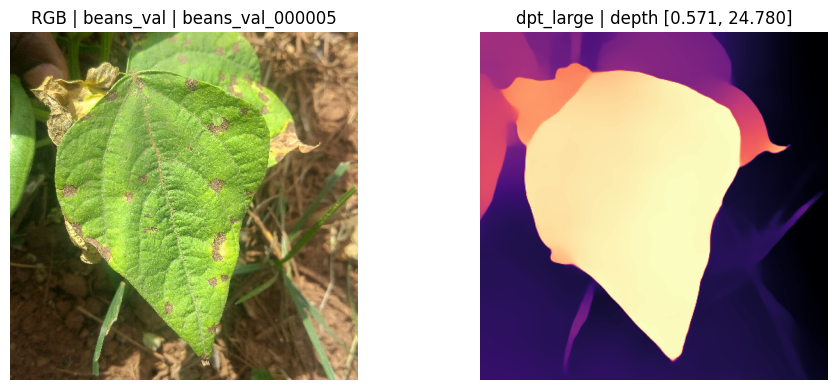

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/beans_val__beans_val_000005__dpt_large__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/beans_val__beans_val_000005__dpt_large__depth.npy


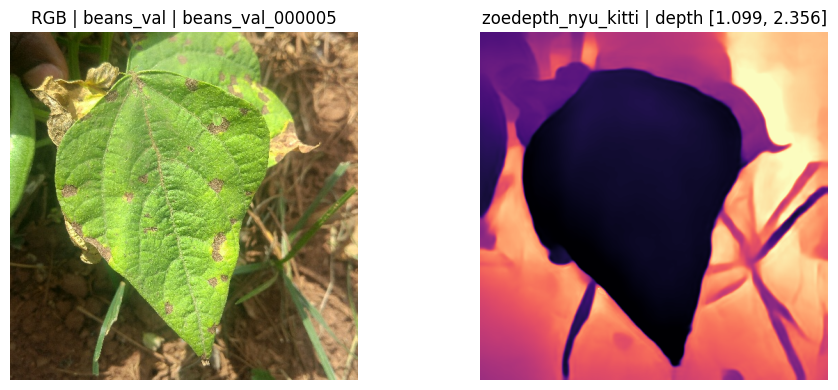

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/beans_val__beans_val_000005__zoedepth_nyu_kitti__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/beans_val__beans_val_000005__zoedepth_nyu_kitti__depth.npy

=== Sample: food101_val | food101_val_000003 ===


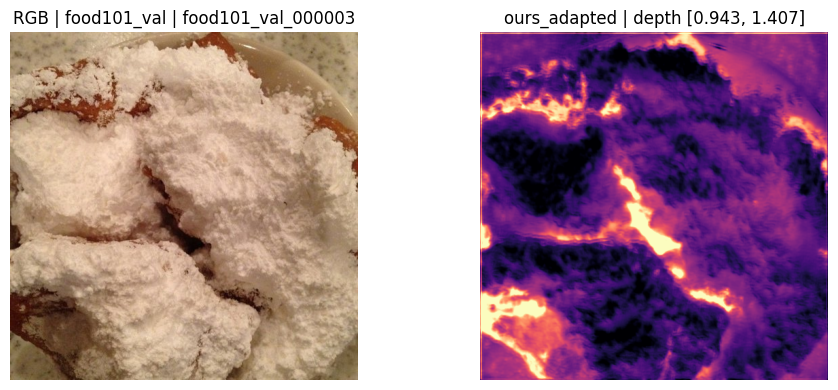

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/food101_val__food101_val_000003__ours_adapted__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/food101_val__food101_val_000003__ours_adapted__depth.npy


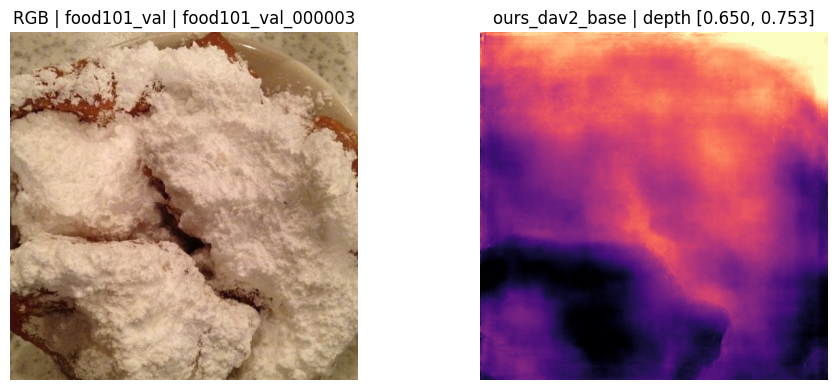

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/food101_val__food101_val_000003__ours_dav2_base__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/food101_val__food101_val_000003__ours_dav2_base__depth.npy


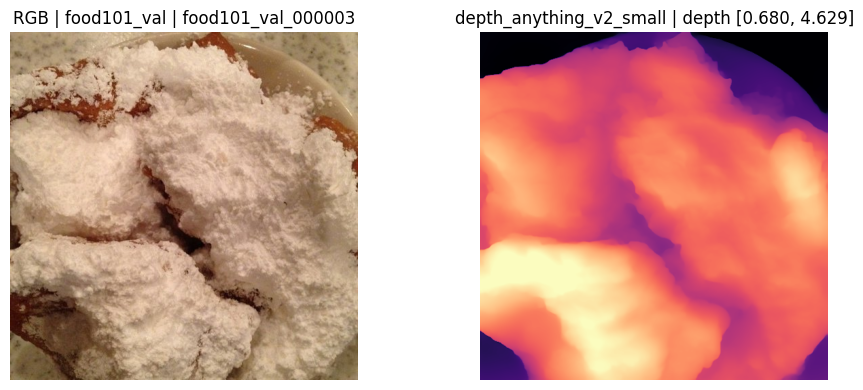

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/food101_val__food101_val_000003__depth_anything_v2_small__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/food101_val__food101_val_000003__depth_anything_v2_small__depth.npy


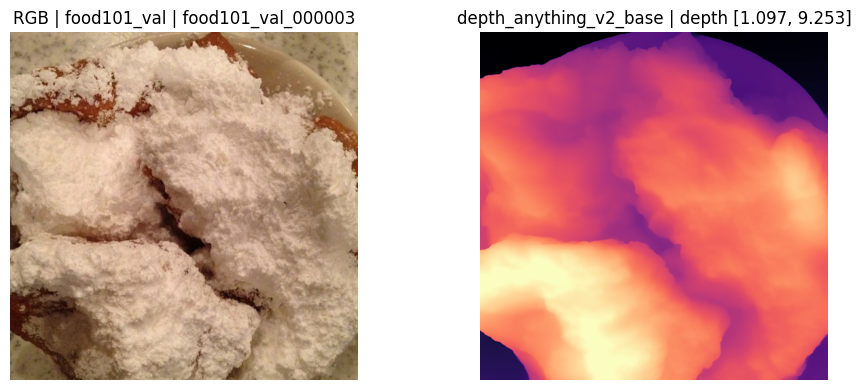

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/food101_val__food101_val_000003__depth_anything_v2_base__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/food101_val__food101_val_000003__depth_anything_v2_base__depth.npy


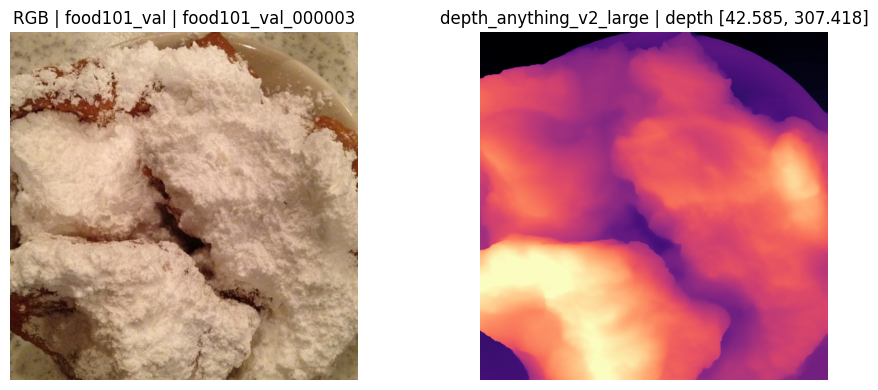

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/food101_val__food101_val_000003__depth_anything_v2_large__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/food101_val__food101_val_000003__depth_anything_v2_large__depth.npy


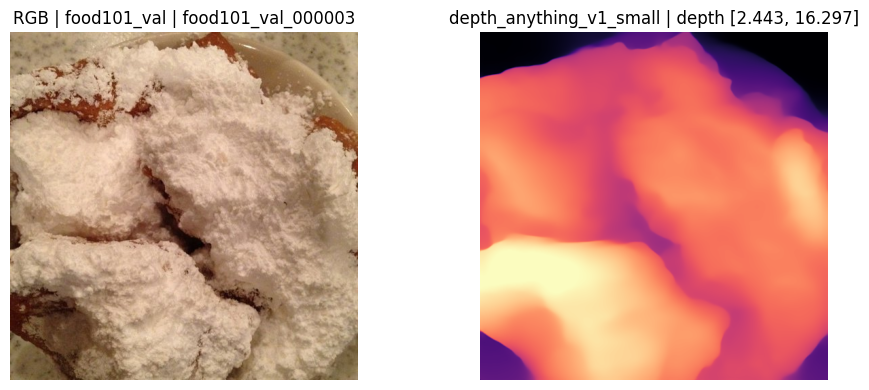

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/food101_val__food101_val_000003__depth_anything_v1_small__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/food101_val__food101_val_000003__depth_anything_v1_small__depth.npy


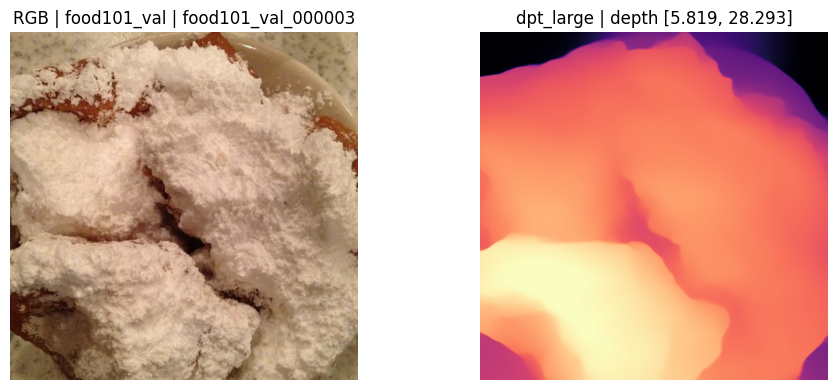

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/food101_val__food101_val_000003__dpt_large__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/food101_val__food101_val_000003__dpt_large__depth.npy


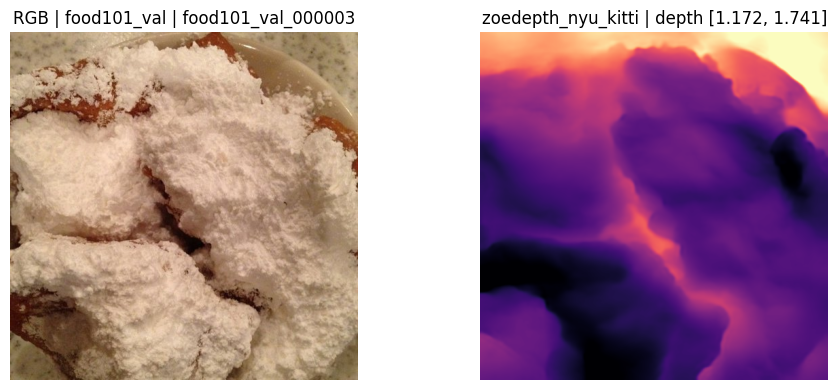

saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/food101_val__food101_val_000003__zoedepth_nyu_kitti__depth.png
saved: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models/food101_val__food101_val_000003__zoedepth_nyu_kitti__depth.npy

Done. Outputs in: /kaggle/working/EagleVision/outputs/quick_depth_single_image_all_models


In [11]:
# Build enabled models
enabled_models = [m for m in CONFIG["models"] if m.get("enabled", False)]
print("Enabled models:")
for m in enabled_models:
    print(" -", m["id"])

estimators = {}
failed = {}
model_specs_by_id = {m["id"]: m for m in enabled_models}

for spec in enabled_models:
    print("Loading model:", spec["id"])
    est, err = try_build_estimator(spec)
    if est is None:
        failed[spec["id"]] = err
        print("  [failed]", err)
    else:
        estimators[spec["id"]] = est
        print("  [ok]")

if len(estimators) == 0:
    raise RuntimeError(f"No model loaded successfully. Failed: {failed}")

all_metric_rows = []

for sample in selected_samples:
    img = sample["image"].convert("RGB")
    dname = sample["dataset"]
    sid = sample["sample_id"]
    h, w = img.height, img.width

    gt_depth = sample.get("gt_depth")
    if gt_depth is not None:
        gt_depth = np.asarray(gt_depth, dtype=np.float32)
        if gt_depth.shape != (h, w):
            gt_depth = resize_depth_like_np(gt_depth, h, w)

    print(f"\n=== Sample: {dname} | {sid} | has_gt={gt_depth is not None} ===")

    sample_rows = []

    for mid, est in estimators.items():
        try:
            raw_pred = est.predict(img)
            pred_2d = to_depth_2d(raw_pred, target_hw=(h, w))
            if pred_2d.shape != (h, w):
                pred_2d = resize_depth_like_np(pred_2d, h, w)

            near_is_larger = model_near_is_larger(model_specs_by_id.get(mid, {}))
            pred_eval, scale_used = align_prediction_for_eval(
                pred_2d,
                gt_depth if gt_depth is not None else None,
                near_is_larger=near_is_larger,
                eps=CONFIG.get("depth_eps", 1e-6),
            )

            if gt_depth is not None:
                vis_vmin, vis_vmax = robust_range(gt_depth)
            else:
                vis_vmin, vis_vmax = robust_range(pred_eval)

            # RGB + GT + prediction
            ncols = 3 if gt_depth is not None else 2
            fig, ax = plt.subplots(1, ncols, figsize=(5 * ncols, 4))
            if ncols == 2:
                ax = [ax[0], ax[1]]

            ax[0].imshow(np.asarray(img))
            ax[0].set_title(f"RGB | {dname} | {sid}")
            ax[0].axis("off")

            if gt_depth is not None:
                gt_rgb = depth_to_bright_near_rgb(gt_depth, vmin=vis_vmin, vmax=vis_vmax, cmap_name="magma", near_is_larger=False)
                ax[1].imshow(gt_rgb)
                ax[1].set_title(f"GT depth [{vis_vmin:.3f}, {vis_vmax:.3f}]")
                ax[1].axis("off")

                pred_rgb = depth_to_bright_near_rgb(pred_eval, vmin=vis_vmin, vmax=vis_vmax, cmap_name="magma", near_is_larger=False)
                ax[2].imshow(pred_rgb)
                ax[2].set_title(f"{mid} | aligned scale={scale_used:.3f}")
                ax[2].axis("off")
            else:
                pred_vmin, pred_vmax = robust_range(pred_eval)
                pred_rgb = depth_to_bright_near_rgb(pred_eval, vmin=pred_vmin, vmax=pred_vmax, cmap_name="magma", near_is_larger=False)
                ax[1].imshow(pred_rgb)
                ax[1].set_title(f"{mid} | depth [{pred_vmin:.3f}, {pred_vmax:.3f}]")
                ax[1].axis("off")

            plt.tight_layout()
            plt.show()

            row = {
                "dataset": dname,
                "sample_id": sid,
                "model": mid,
                "has_gt": gt_depth is not None,
                "near_is_larger": near_is_larger,
                "scale_used": float(scale_used),
            }

            if gt_depth is not None:
                m = compute_depth_metrics(pred_eval, gt_depth, eps=CONFIG.get("depth_eps", 1e-6))
                row.update(m)
                sample_rows.append(row)
                all_metric_rows.append(row)
                print(
                    f"  {mid}: AbsRel={m['abs_rel']:.4f} RMSE={m['rmse']:.4f} "
                    f"L1={m['l1']:.4f} d1={m['delta1']:.4f} valid={m['valid_px']} scale={scale_used:.3f}"
                )

            if CONFIG["save_outputs"]:
                out_png = OUT_DIR / f"{dname}__{sid}__{mid}__depth.png"
                Image.fromarray(pred_rgb).save(out_png)
                print("saved:", out_png)

                if CONFIG.get("save_raw_npy", True):
                    out_npy = OUT_DIR / f"{dname}__{sid}__{mid}__depth.npy"
                    np.save(out_npy, pred_eval.astype(np.float32))
                    print("saved:", out_npy)

        except Exception as e:
            print(f"[predict failed] {mid}: {e}")

    if sample_rows:
        sample_df = pd.DataFrame(sample_rows).sort_values(["abs_rel", "rmse"], ascending=[True, True])
        print("\nPer-sample ranking (lower AbsRel/RMSE better):")
        display(sample_df[["model", "abs_rel", "rmse", "l1", "delta1", "valid_px", "scale_used", "near_is_larger"]])

if all_metric_rows:
    df_all = pd.DataFrame(all_metric_rows)
    agg = (
        df_all.groupby("model", as_index=False)[["abs_rel", "rmse", "l1", "delta1"]]
        .mean(numeric_only=True)
        .sort_values(["abs_rel", "rmse"], ascending=[True, True])
    )
    print("\nAggregate model ranking across selected ScanNet samples:")
    display(agg)

if failed:
    print("\nModels that failed to load:")
    for k, v in failed.items():
        print(" -", k, "=>", v)
